In [ ]:
import torch
import matplotlib.pyplot as plt
import random
from torchvision import transforms
from torch.utils.data import DataLoader

# Importamos tu arquitectura y tu dataset
from models.model import UNET
from dataset.dataset import ImageDataset
from visualization.ode_solver import sample_rectified_flow

In [2]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# 1. Instanciar la arquitectura (con los mismos parámetros que usaste en train)
model = UNET(channels_in=3, channels=128, channels_out=3).to(device)

# 2. Cargar los pesos guardados
# Asegúrate de poner la ruta correcta a tu archivo final
model_path = 'results/cheetah_v2_full/cheetah_v2_full_final.pth'
model.load_state_dict(torch.load(model_path, map_location=device))
model.eval()

print("Modelo cargado y listo para inferencia.")

/tmp/ipykernel_6295/2513048081.py:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path, map_location=device))


Modelo cargado y listo para inferencia.


In [3]:
transform = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])


idx:  535
Calculando para 1 pasos...
Calculando para 2 pasos...
Calculando para 5 pasos...
Calculando para 10 pasos...
Calculando para 100 pasos...


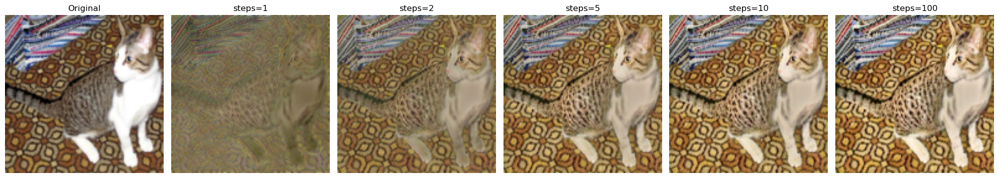

In [141]:
# Funciones
# configuración
pathA = r"dataset/PetImages/Cat"
pathB = r"dataset/cats_projekat/cheetahs"
idx = random.randint(0,999)
print("idx: ",idx)
ds_test = ImageDataset(pathA, pathB, transform=transform, max_samples=1000)
data = ds_test[idx]
# De (C, H, W) pasa a (1, C, H, W)
X0 = data["X0"].unsqueeze(0)
@torch.no_grad() # Evita consumo innecesario de memoria
def plot1(X0,model,path_save=None):
    '''Esta función intenta gráficar la imágen original desde Z0=X0 en t=0
       y va mostrando las inferencias del algoritmo rectified flow con n_steps = [1,2,5,10,1000]
       X0 : imagen a gráficar
       model : modelo del cual se hace la inferencia  
    '''
    model.eval()
    n_steps = [1,2,5,10,100]
    resultados = []
    # Guardamos el original (t=0) para la primera columna
    img_original = (X0[0].cpu().permute(1, 2, 0) * 0.5 + 0.5).clamp(0, 1)
    resultados.append(("Original", img_original))
    # 3. Correr la inferencia para cada n_pasos
    for n in n_steps:
      print(f"Calculando para {n} pasos...")
      # Solo nos interesa el resultado final z1_final
      z1_final, _ = sample_rectified_flow(model, X0, num_steps=n, device=device)
    
      # Procesar para mostrar
      img_res = (z1_final[0].cpu().permute(1, 2, 0) * 0.5 + 0.5).clamp(0, 1)
      resultados.append((f"steps={n}", img_res))

      # 4. Visualización
    fig, axes = plt.subplots(1, len(resultados), figsize=(20, 8))

    for i, (titulo, img) in enumerate(resultados):
       axes[i].imshow(img)
       axes[i].set_title(titulo)
       axes[i].axis('off')
    plt.tight_layout()
    plt.show()


plot1(X0, model)


Calculando para 1 pasos...
Calculando para 2 pasos...
Calculando para 5 pasos...
Calculando para 10 pasos...
Calculando para 500 pasos...


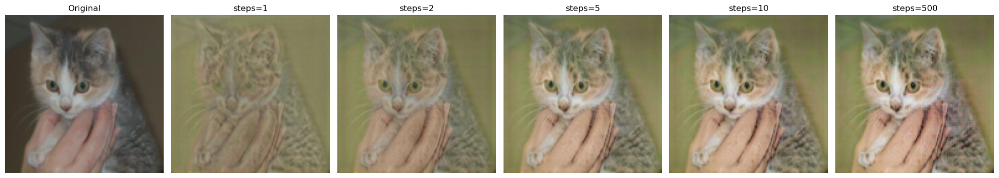

In [122]:
# 1. Preparar los datos (mismo gato para todos los experimentos)
ds_test = ImageDataset("dataset/PetImages/Cat", "dataset/cats_projekat/cheetahs", transform=transform, max_samples=10)
loader = DataLoader(ds_test, batch_size=1, shuffle=True)
batch = next(iter(loader))
x0 = batch["X0"].to(device)

# 2. Definir los pasos que quieres comparar
pasos_a_probar = [1, 2, 5, 10, 500]
resultados = []

# Guardamos el original (t=0) para la primera columna
img_original = (x0[0].cpu().permute(1, 2, 0) * 0.5 + 0.5).clamp(0, 1)
resultados.append(("Original", img_original))

# 3. Correr la inferencia para cada n_pasos
for n in pasos_a_probar:
    print(f"Calculando para {n} pasos...")
    # Solo nos interesa el resultado final z1_final
    z1_final, _ = sample_rectified_flow(model, x0, num_steps=n, device=device)
    
    # Procesar para mostrar
    img_res = (z1_final[0].cpu().permute(1, 2, 0) * 0.5 + 0.5).clamp(0, 1)
    resultados.append((f"steps={n}", img_res))

# 4. Visualización
fig, axes = plt.subplots(1, len(resultados), figsize=(20, 5))

for i, (titulo, img) in enumerate(resultados):
    axes[i].imshow(img)
    axes[i].set_title(titulo)
    axes[i].axis('off')

plt.tight_layout()
plt.show()

idx:  393


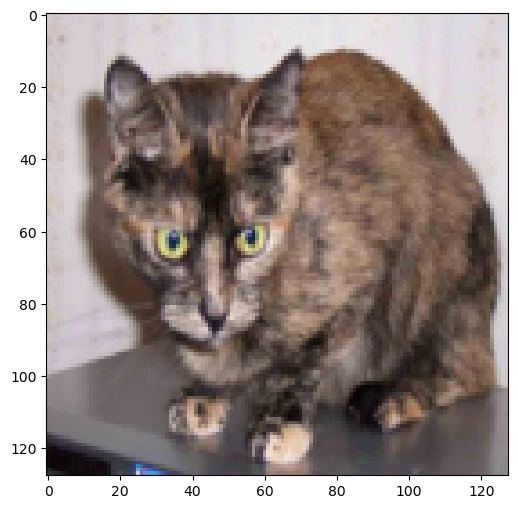

In [144]:
# 1. Preparar los datos (mismo gato para todos los experimentos)
ds_test = ImageDataset("dataset/PetImages/Cat", "dataset/cats_projekat/cheetahs", transform=transform, max_samples=1000)
# 1. Elegir un índice del set de validación
idx = random.randint(0,999)
print("idx: ",idx)
data = ds_test[idx] # Esto devuelve el diccionario {"X0": tensor, "X1": tensor}

fig, ax = plt.subplots(figsize=(8,6))
ax.imshow(data["X0"].permute(1,2,0)* 0.5 + 0.5)

In [58]:
device

device(type='cuda')

idx:  897


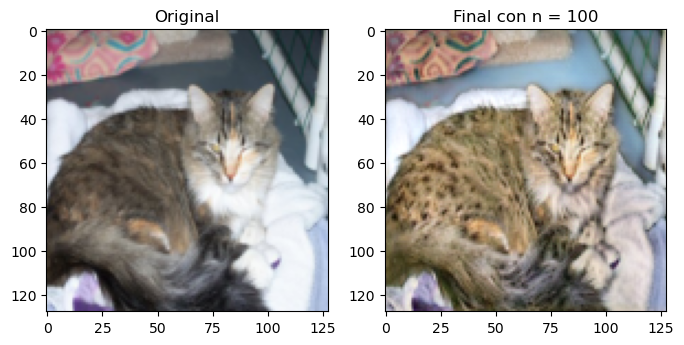

In [157]:
# Funciones
# configuración
pathA = r"dataset/PetImages/Cat"
pathB = r"dataset/cats_projekat/cheetahs"
idx = random.randint(0,999)
print("idx: ",idx)
ds_test = ImageDataset(pathA, pathB, transform=transform, max_samples=1000)
data = ds_test[idx]
# De (C, H, W) pasa a (1, C, H, W)
X0 = data["X0"].unsqueeze(0) 
n = 100
@torch.no_grad() # Evita consumo innecesario de memoria
def plot2(X0,model,device, n_steps, save=None):
    X0 = X0.to(device)
    # Solo nos interesa el resultado final z1_final
    z1_final, _ = sample_rectified_flow(model, X0, n_steps, device=device)
    # Procesar para mostrar
    img_res = (z1_final[0].cpu().permute(1, 2, 0) * 0.5 + 0.5).clamp(0, 1)
    fig, ax = plt.subplots(1,2,figsize=(8,6))
    ax[0].imshow(X0[0].cpu().permute(1,2,0)* 0.5 + 0.5)
    ax[0].set_title("Original")
    ax[1].imshow(img_res)
    ax[1].set_title(f"Final con n = {n_steps}")
plot2(X0,model,device,n)


    

idx:  920


Text(0.5, 1.0, 'Final con n = 50')

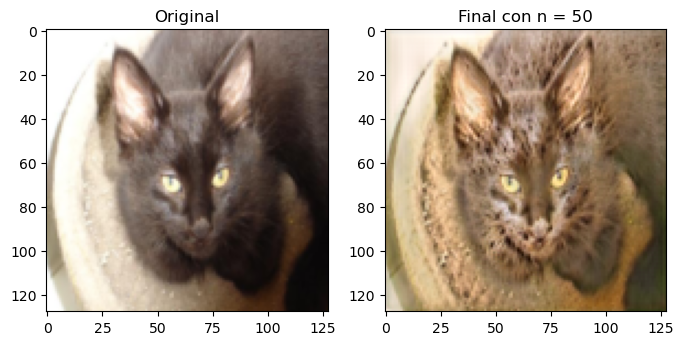

In [139]:
# 1. Preparar los datos (mismo gato para todos los experimentos)
ds_test = ImageDataset("dataset/PetImages/Cat", "dataset/cats_projekat/cheetahs", transform=transform, max_samples=1000)
# 1. Elegir un índice del set de validación
idx = random.randint(0,999)
print("idx: ",idx)
data = ds_test[idx] # Esto devuelve el diccionario {"X0": tensor, "X1": tensor}
# 2. Preparar para el modelo (añadir dimensión de batch)
img_prueba = data["X0"].unsqueeze(0) # De (C, H, W) pasa a (1, C, H, W)
# 3. Mover a GPU si es necesario y predecir
img_prueba = img_prueba.to(device)
n=50
# Solo nos interesa el resultado final z1_final
z1_final, _ = sample_rectified_flow(model, img_prueba, num_steps=n, device=device)
# Procesar para mostrar
img_res = (z1_final[0].cpu().permute(1, 2, 0) * 0.5 + 0.5).clamp(0, 1)
fig, ax = plt.subplots(1,2,figsize=(8,6))
ax[0].imshow(data["X0"].permute(1,2,0)* 0.5 + 0.5)
ax[0].set_title("Original")
ax[1].imshow(img_res)
ax[1].set_title(f"Final con n = {n}")

In [48]:
import matplotlib.animation as animation
from IPython.display import HTML

def create_flow_gif(trayectorias, fps=10):
    fig, ax = plt.subplots(figsize=(5, 5))
    ax.axis('off')
    
    # Preparamos la lista de imágenes para la animación
    imgs = []
    num_pasos = trayectorias.shape[0]
    
    for i in range(num_pasos):
        # Des-normalizar (de [-1, 1] a [0, 1]) y reordenar canales
        img = trayectorias[i, 0].cpu().permute(1, 2, 0)
        img = (img * 0.5 + 0.5).clamp(0, 1).numpy()
        
        # Guardamos el frame
        im = ax.imshow(img, animated=True)
        # Añadimos el texto del tiempo para que se vea profesional
        txt = ax.text(0.5, 1.05, f'Tiempo t = {i/(num_pasos-1):.2f}', 
                      size=plt.rcParams["axes.titlesize"],
                      ha="center", transform=ax.transAxes)
        imgs.append([im, txt])

    # Crear la animación
    ani = animation.ArtistAnimation(fig, imgs, interval=1000/fps, blit=True, repeat_delay=1000)
    
    plt.close() # Para que no se muestre la imagen estática abajo
    return ani
num_steps = 100
z1_final, trayectorias = sample_rectified_flow(model, x0, num_steps=num_steps, device=device)
# --- Ejecución ---
ani = create_flow_gif(trayectorias)

# Para verlo directamente en el Notebook:
HTML(ani.to_jshtml())

# Para guardarlo en tu carpeta de resultados:
#ani.save('results/cheetah_v2_fulltransformacion1.gif', writer='pillow', fps=fps)

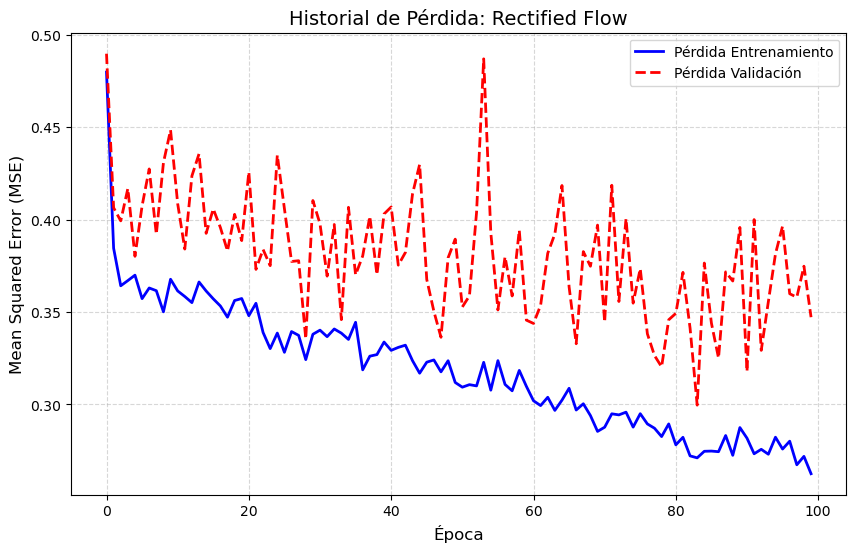

In [16]:
import json
import matplotlib.pyplot as plt

# 1. Cargar los datos
log_path = 'results/cheetah_v2_full/loss_history.json'
with open(log_path, 'r') as f:
    history = json.load(f)

# 2. Crear la gráfica
plt.figure(figsize=(10, 6))
plt.plot(history['train'], label='Pérdida Entrenamiento', color='blue', linewidth=2)
plt.plot(history['val'], label='Pérdida Validación', color='red', linestyle='--', linewidth=2)

# 3. Estética de la gráfica (para tu reporte)
plt.title('Historial de Pérdida: Rectified Flow', fontsize=14)
plt.xlabel('Época', fontsize=12)
plt.ylabel('Mean Squared Error (MSE)', fontsize=12)
plt.grid(True, which='both', linestyle='--', alpha=0.5)
plt.legend()

# Opcional: Escala logarítmica si la pérdida baja mucho
# plt.yscale('log')

plt.show()

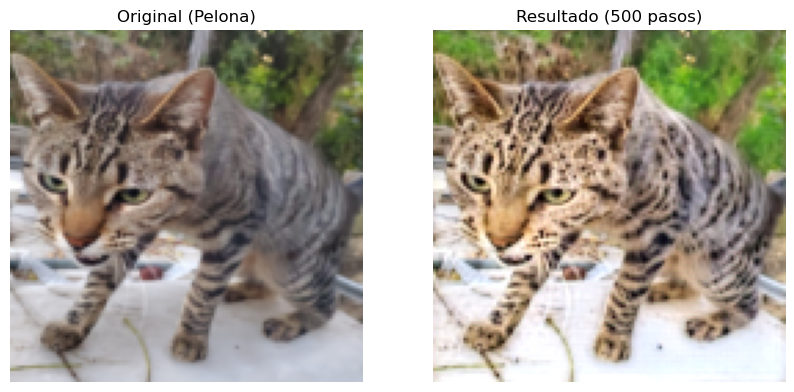

In [ ]:
from PIL import Image

# 1. Ruta de tu imagen específica
pelona_path = "dataset/PetImages/pelona3.jpeg"

# 2. Definir las mismas transformaciones del entrenamiento
# Es vital que el Resize y Normalize sean idénticos
inference_transform = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

# 3. Cargar y preparar la imagen
img_raw = Image.open(pelona_path).convert('RGB')
x0_pelona = inference_transform(img_raw).unsqueeze(0).to(device) # unsqueeze añade el batch dimension (1, 3, 128, 128)

# 4. Ejecutar el flujo (puedes probar con 10 o 50 pasos para ver la calidad)
num_steps = 500
z1_final, trayectorias = sample_rectified_flow(model, x0_pelona, num_steps=num_steps, device=device)

# 5. Visualizar el resultado (Original vs Transformado)
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Procesar original
img_in = (x0_pelona[0].cpu().permute(1, 2, 0) * 0.5 + 0.5).clamp(0, 1)
axes[0].imshow(img_in)
axes[0].set_title("Original (Pelona)")
axes[0].axis('off')

# Procesar resultado final
img_out = (z1_final[0].cpu().permute(1, 2, 0) * 0.5 + 0.5).clamp(0, 1)
axes[1].imshow(img_out)
axes[1].set_title(f"Resultado ({num_steps} pasos)")
axes[1].axis('off')

plt.show()
